In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [34 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/tmp/pip-install-snfph00z/pyyaml_39d8c2bf83a04eddb4e20f422a038602/setup.py", line 291, in <module>
          setup(
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 185, in setup
          return run_commands(dist)
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/core.py", line 201, in run_commands
          dist.run_commands()
        File "/opt/conda/lib/python3.10/site-packages/setuptools/_distutils/dist.py", line 969, in run_commands
          self.run_command(cmd)
        File "/opt/conda/lib/pyth

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [4]:
!kaggle datasets download -d tannergi/chess-piece-detection

Dataset URL: https://www.kaggle.com/datasets/tannergi/chess-piece-detection
License(s): Attribution 4.0 International (CC BY 4.0)
 96%|██████████████████████████████████████▎ | 159M/166M [00:01<00:00, 93.6MB/s]
100%|████████████████████████████████████████| 166M/166M [00:01<00:00, 95.9MB/s]


In [5]:
!unzip chess-piece-detection.zip

Archive:  chess-piece-detection.zip
  inflating: Chess Detection/annotations/IMG_1989.xml  
  inflating: Chess Detection/annotations/IMG_1990.xml  
  inflating: Chess Detection/annotations/IMG_1991.xml  
  inflating: Chess Detection/annotations/IMG_1992.xml  
  inflating: Chess Detection/annotations/IMG_1993.xml  
  inflating: Chess Detection/annotations/IMG_1994.xml  
  inflating: Chess Detection/annotations/IMG_1995.xml  
  inflating: Chess Detection/annotations/IMG_1996.xml  
  inflating: Chess Detection/annotations/IMG_1997.xml  
  inflating: Chess Detection/annotations/IMG_1998.xml  
  inflating: Chess Detection/annotations/IMG_1999.xml  
  inflating: Chess Detection/annotations/IMG_2000.xml  
  inflating: Chess Detection/annotations/IMG_2001.xml  
  inflating: Chess Detection/annotations/IMG_2002.xml  
  inflating: Chess Detection/annotations/IMG_2003.xml  
  inflating: Chess Detection/annotations/IMG_2004.xml  
  inflating: Chess Detection/annotations/IMG_2005.xml  
  inflating:

In [6]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2
import xml.etree.ElementTree as ET


# write a function that loads the dataset into detectron2's standard format
def get_dataset_dicts(annotation_path, image_path):
    classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

    dataset_dicts = []
    for idx, filename in enumerate(os.listdir(annotation_path)):
        record = {}
        root = ET.parse(os.path.join(annotation_path, filename)).getroot()
        record["file_name"] = os.path.join(image_path, root.find('filename').text)
        record["height"] = 2248
        record["width"] = 4000

        objs = []
        for member in root.findall('object'):
          obj = {
              'bbox': [int(member[4][0].text), int(member[4][1].text), int(member[4][2].text), int(member[4][3].text)],
              'bbox_mode': BoxMode.XYXY_ABS,
              'category_id': classes.index(member[0].text),
              "iscrowd": 0
          }
          objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [7]:
from detectron2.data import DatasetCatalog, MetadataCatalog

classes = ['white-rook', 'white-knight', 'white-bishop', 'white-king', 'white-queen', 'white-pawn', 'black-rook', 'black-knight', 'black-bishop', 'black-king', 'black-queen', 'black-pawn']

DatasetCatalog.register('chess_piece_dataset', lambda: get_dataset_dicts('Chess Detection/annotations', 'Chess Detection/images'))
MetadataCatalog.get('chess_piece_dataset').set(thing_classes=classes)
chess_metadata = MetadataCatalog.get('chess_piece_dataset')

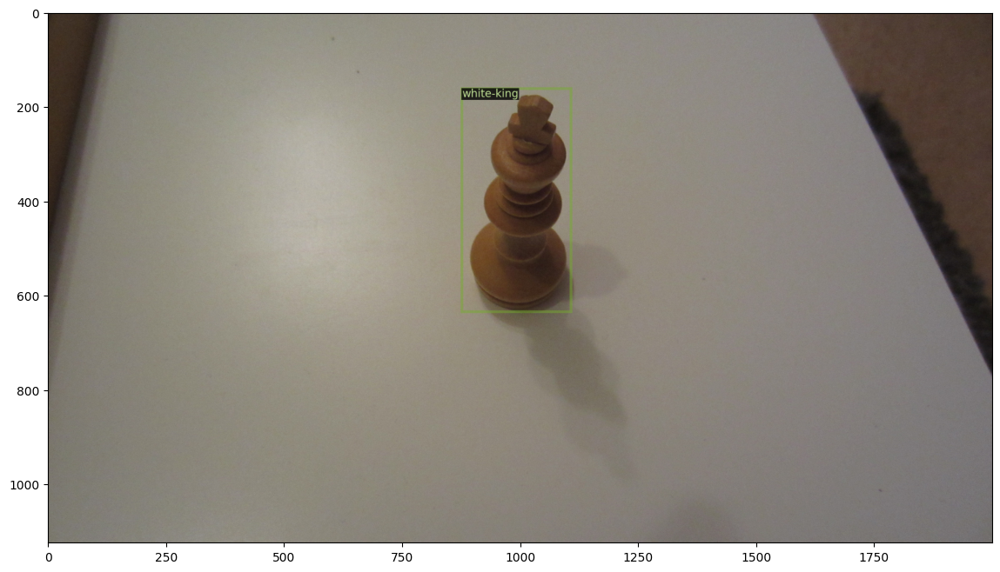

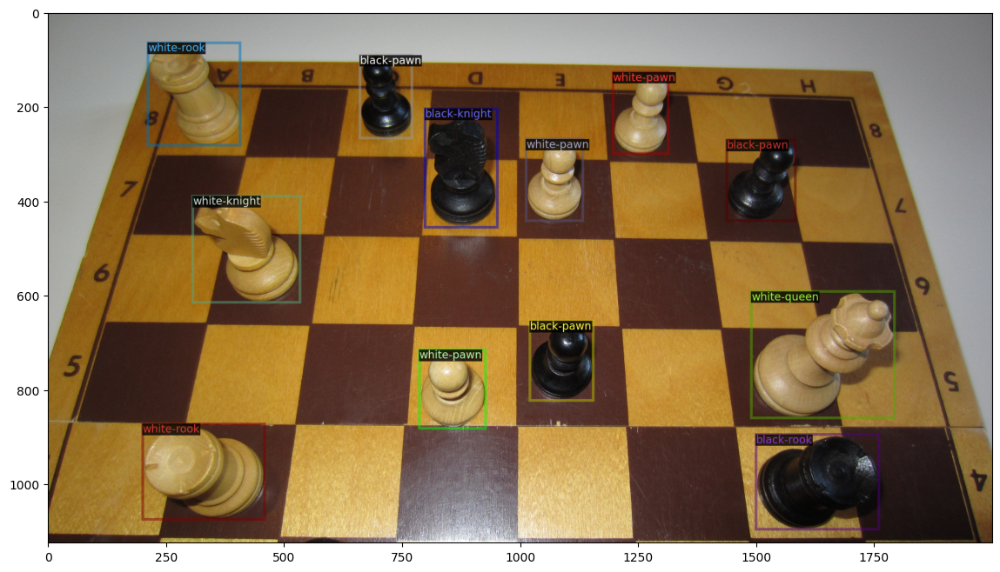

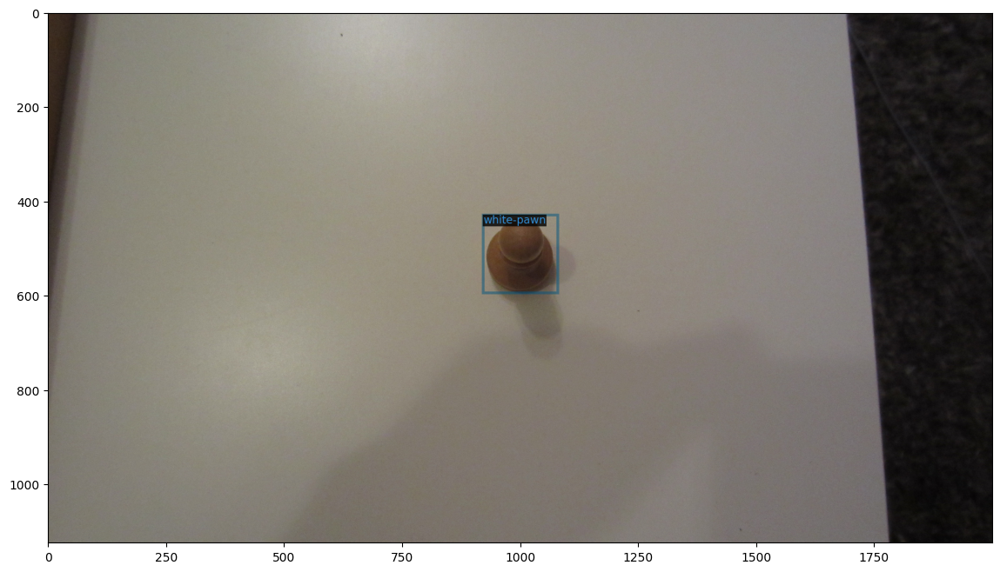

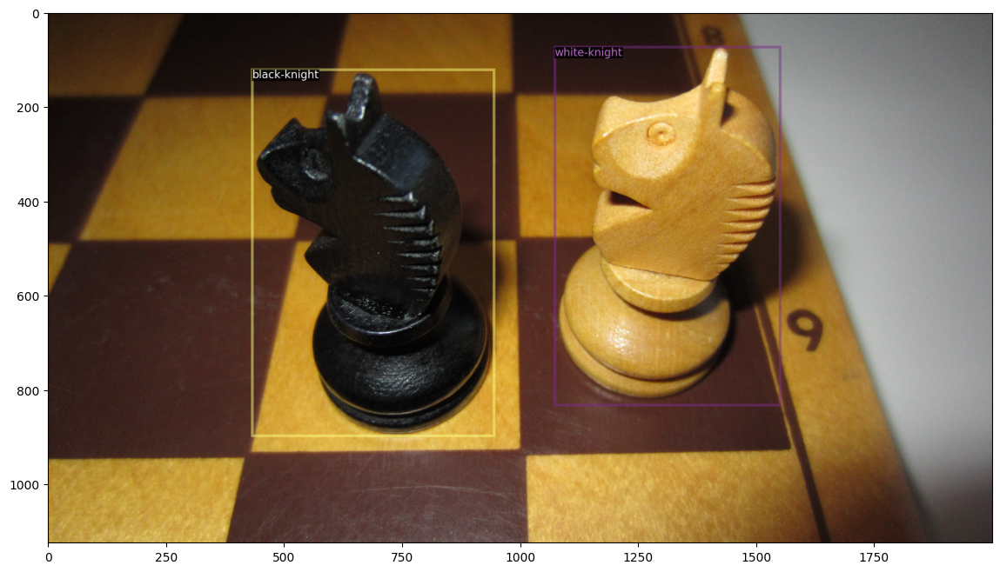

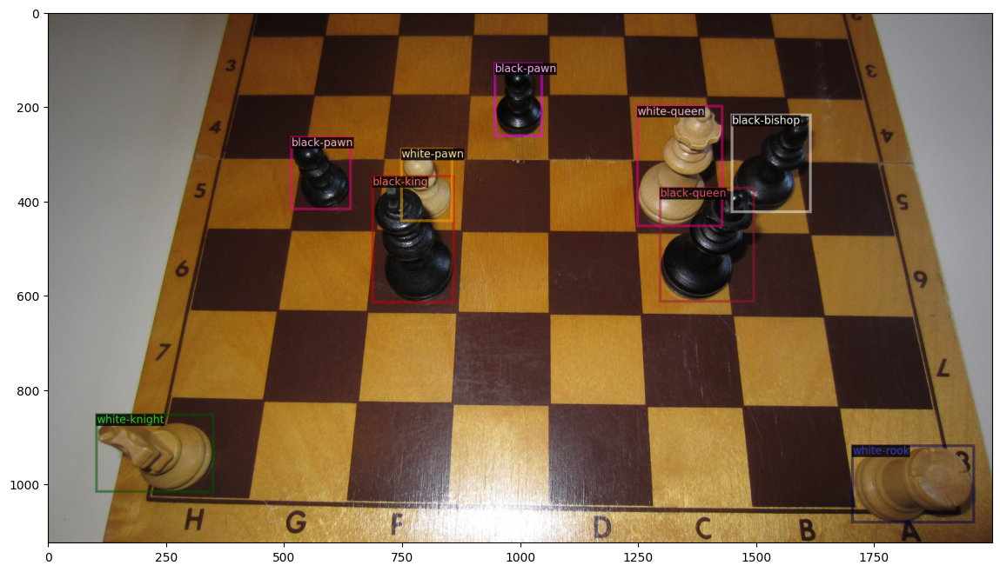

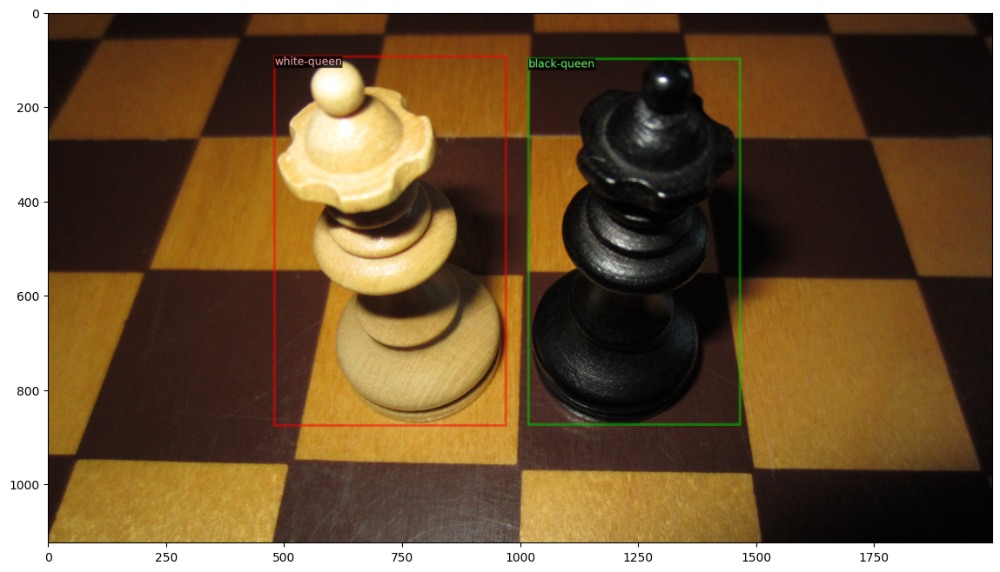

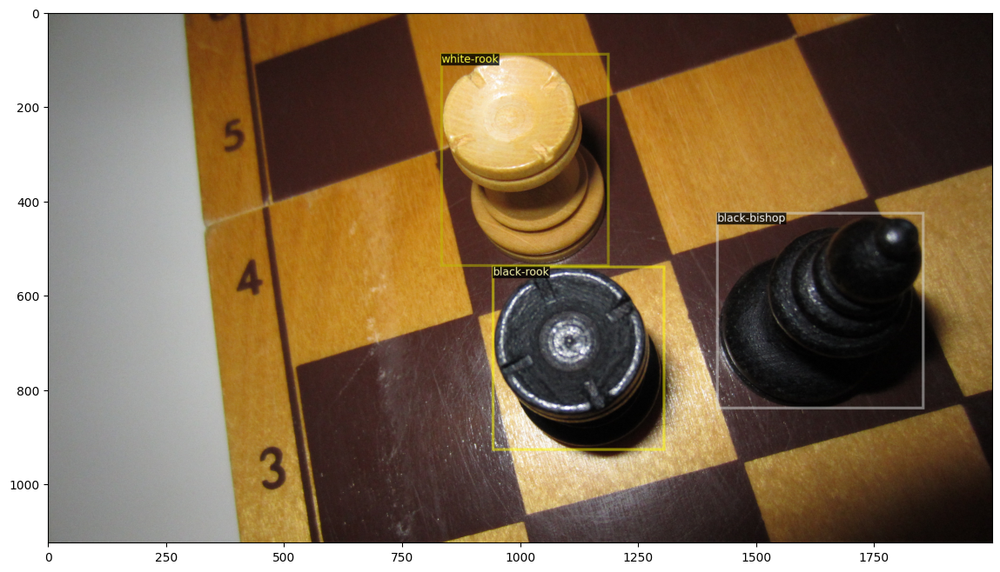

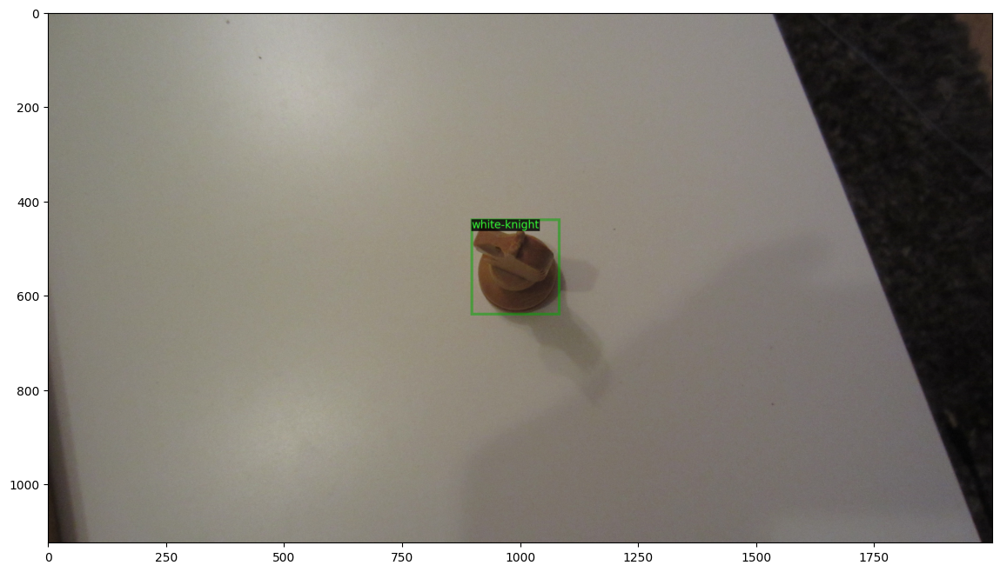

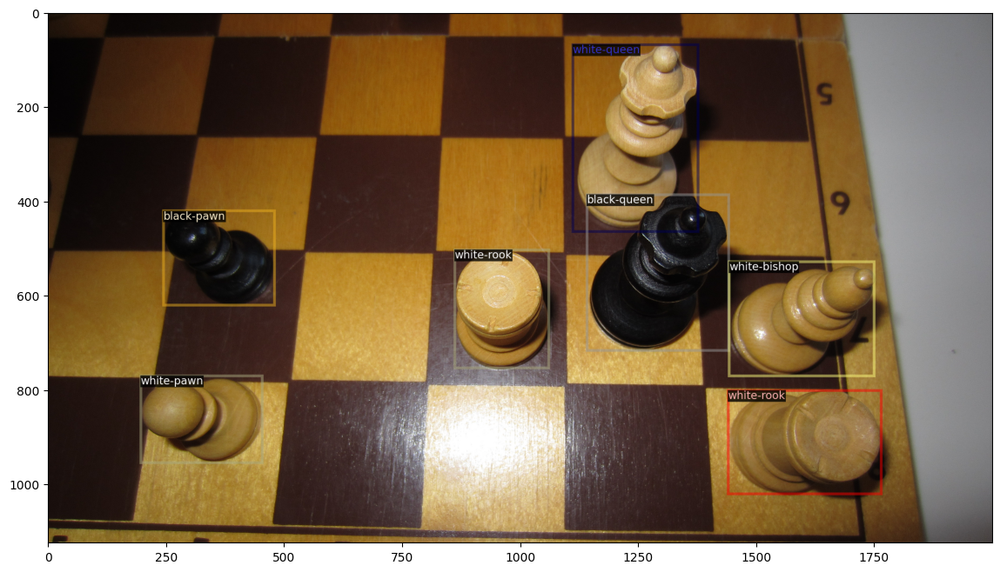

In [8]:
import random
from detectron2.utils.visualizer import Visualizer

dataset_dicts = DatasetCatalog.get('chess_piece_dataset')
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=chess_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [9]:
import os
import logging
import time
from detectron2.engine import DefaultTrainer, HookBase
from detectron2.config import get_cfg
from detectron2 import model_zoo
from tabulate import tabulate
from detectron2.data import DatasetCatalog, MetadataCatalog

# Configure logging
log_file = 'training_log.txt'
logging.basicConfig(filename=log_file, level=logging.INFO)

# Print message to console to confirm logging setup
print(f"Logging to {log_file}")

# List of learning rates to experiment with
learning_rates = [0.001, 0.005, 0.01]

# Number of iterations and runs
num_iterations = 1000
num_runs = 10

# Data structure to store results
results = []

# Custom hook to log the training progress
class LossLoggerHook(HookBase):
    def __init__(self):
        super().__init__()

    def after_step(self):
        if self.trainer.storage.iter % 20 == 0:  # Log every 20 iterations
            total_loss = self.trainer.storage.history("total_loss").latest()
            logging.info(f"iter: {self.trainer.storage.iter} total_loss: {total_loss}")
            print(f"Logged iteration {self.trainer.storage.iter}")

# Function to train with a specific learning rate
def train_with_learning_rate(lr):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
    cfg.DATASETS.TRAIN = ('chess_piece_dataset',)
    cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.MAX_ITER = num_iterations
    cfg.SOLVER.STEPS = []  # do not decay learning rate
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 12
    cfg.SOLVER.BASE_LR = lr  # Set learning rate

    # Implement gradient clipping correctly
    cfg.SOLVER.CLIP_GRADIENTS.ENABLED = True
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_TYPE = "norm"
    cfg.SOLVER.CLIP_GRADIENTS.CLIP_VALUE = 1.0

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg)
    trainer.register_hooks([LossLoggerHook()])

    start_time = time.time()
    trainer.resume_or_load(resume=False)
    trainer.train()
    end_time = time.time()

    # Get the minimum loss over all iterations
    min_loss = min(trainer.storage.history("total_loss").values())

    return min_loss, end_time - start_time

# Run training for each learning rate
for lr in learning_rates:
    lr_results = []
    for run in range(num_runs):
        logging.info(f"Starting training with learning rate: {lr}, run: {run + 1}")
        print(f"Starting training with learning rate: {lr}, run: {run + 1}")
        min_loss, duration = train_with_learning_rate(lr)
        lr_results.append([lr, run + 1, min_loss, duration])
    results.extend(lr_results)

# Aggregate results for each learning rate
summary_results = []
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    min_loss = min(lr_runs, key=lambda x: x[2])[2]
    total_time = sum(run[3] for run in lr_runs)
    summary_results.append([lr, min_loss, total_time])

# Tabulate the detailed results for each run
headers = ["Learning Rate", "Run", "Minimum Loss", "Duration (s)"]
print(tabulate(results, headers, floatfmt=".6f"))

# Log the detailed results to the file
logging.info(tabulate(results, headers, floatfmt=".6f"))

# Tabulate and print the summary results
summary_headers = ["Learning Rate", "Minimum Loss", "Total Time (s)"]
print(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Log the summary results to the file
logging.info(tabulate(summary_results, summary_headers, floatfmt=".6f"))

# Tabulate the detailed results for each learning rate
for lr in learning_rates:
    lr_runs = [result for result in results if result[0] == lr]
    print(f"\nDetailed results for learning rate: {lr}")
    print(tabulate(lr_runs, headers, floatfmt=".6f"))
    logging.info(f"\nDetailed results for learning rate: {lr}")
    logging.info(tabulate(lr_runs, headers, floatfmt=".6f"))


Logging to training_log.txt
Starting training with learning rate: 0.001, run: 1
[06/03 08:51:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (n

model_final_f6e8b1.pkl: 243MB [00:00, 259MB/s]                             


[06/03 08:51:56 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Logged iteration 0
[06/03 08:52:09 d2.utils.events]:  eta: 0:07:48  iter: 19  total_loss: 2.98  loss_cls: 2.446  loss_box_reg: 0.4888  loss_rpn_cls: 0.02809  loss_rpn_loc: 0.008918    time: 0.4726  last_time: 0.4841  data_time: 0.0322  last_data_time: 0.0054   lr: 1.9981e-05  max_mem: 3507M


2024-06-03 08:52:11.602920: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-03 08:52:11.603033: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-03 08:52:11.744208: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Logged iteration 20
[06/03 08:52:31 d2.utils.events]:  eta: 0:07:35  iter: 39  total_loss: 2.861  loss_cls: 2.343  loss_box_reg: 0.4879  loss_rpn_cls: 0.01298  loss_rpn_loc: 0.01139    time: 0.4779  last_time: 0.5549  data_time: 0.0242  last_data_time: 0.0639   lr: 3.9961e-05  max_mem: 3507M
Logged iteration 40
[06/03 08:52:40 d2.utils.events]:  eta: 0:07:25  iter: 59  total_loss: 2.677  loss_cls: 2.159  loss_box_reg: 0.4537  loss_rpn_cls: 0.009351  loss_rpn_loc: 0.008776    time: 0.4700  last_time: 0.4207  data_time: 0.0070  last_data_time: 0.0070   lr: 5.9941e-05  max_mem: 3509M
Logged iteration 60
[06/03 08:52:49 d2.utils.events]:  eta: 0:07:15  iter: 79  total_loss: 2.17  loss_cls: 1.789  loss_box_reg: 0.4272  loss_rpn_cls: 0.006918  loss_rpn_loc: 0.008205    time: 0.4685  last_time: 0.4954  data_time: 0.0105  last_data_time: 0.0136   lr: 7.9921e-05  max_mem: 3509M
Logged iteration 80
[06/03 08:52:59 d2.utils.events]:  eta: 0:07:06  iter: 99  total_loss: 1.829  loss_cls: 1.275  los

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:00:01 d2.utils.events]:  eta: 0:07:38  iter: 19  total_loss: 3.101  loss_cls: 2.557  loss_box_reg: 0.505  loss_rpn_cls: 0.03718  loss_rpn_loc: 0.01106    time: 0.4535  last_time: 0.4678  data_time: 0.0540  last_data_time: 0.0062   lr: 1.9981e-05  max_mem: 3511M
Logged iteration 20
[06/03 09:00:10 d2.utils.events]:  eta: 0:07:28  iter: 39  total_loss: 2.933  loss_cls: 2.475  loss_box_reg: 0.4281  loss_rpn_cls: 0.006331  loss_rpn_loc: 0.006022    time: 0.4562  last_time: 0.4084  data_time: 0.0103  last_data_time: 0.0297   lr: 3.9961e-05  max_mem: 3513M
Logged iteration 40
[06/03 09:00:19 d2.utils.events]:  eta: 0:07:18  iter: 59  total_loss: 2.743  loss_cls: 2.268  loss_box_reg: 0.4652  loss_rpn_cls: 0.006725  loss_rpn_loc: 0.008046    time: 0.4541  last_time: 0.4200  data_time: 0.0088  last_data_time: 0.0064   lr: 5.9941e-05  max_mem: 3513M
Logged iteration 60
[06/03 09:00:29 d2.utils.events]:  eta: 0:07:10  iter: 79  total_loss: 2.484  loss_cls: 1.955  loss

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 3
[06/03 09:07:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:07:44 d2.utils.events]:  eta: 0:07:40  iter: 19  total_loss: 3.112  loss_cls: 2.661  loss_box_reg: 0.4512  loss_rpn_cls: 0.02737  loss_rpn_loc: 0.009202    time: 0.4616  last_time: 0.4697  data_time: 0.0374  last_data_time: 0.0062   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:07:53 d2.utils.events]:  eta: 0:07:31  iter: 39  total_loss: 3.078  loss_cls: 2.573  loss_box_reg: 0.5007  loss_rpn_cls: 0.01274  loss_rpn_loc: 0.00913    time: 0.4581  last_time: 0.4660  data_time: 0.0083  last_data_time: 0.0062   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:08:02 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 2.93  loss_cls: 2.339  loss_box_reg: 0.5176  loss_rpn_cls: 0.005095  loss_rpn_loc: 0.009282    time: 0.4617  last_time: 0.4695  data_time: 0.0081  last_data_time: 0.0071   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:08:11 d2.utils.events]:  eta: 0:07:12  iter: 79  total_loss: 2.536  loss_cls: 2.059  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 4
[06/03 09:15:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:15:26 d2.utils.events]:  eta: 0:07:40  iter: 19  total_loss: 3.245  loss_cls: 2.782  loss_box_reg: 0.4276  loss_rpn_cls: 0.01041  loss_rpn_loc: 0.01016    time: 0.4632  last_time: 0.4897  data_time: 0.0422  last_data_time: 0.0065   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:15:35 d2.utils.events]:  eta: 0:07:26  iter: 39  total_loss: 3.272  loss_cls: 2.695  loss_box_reg: 0.5008  loss_rpn_cls: 0.02398  loss_rpn_loc: 0.009197    time: 0.4539  last_time: 0.4165  data_time: 0.0073  last_data_time: 0.0061   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:15:44 d2.utils.events]:  eta: 0:07:17  iter: 59  total_loss: 2.875  loss_cls: 2.486  loss_box_reg: 0.4226  loss_rpn_cls: 0.006391  loss_rpn_loc: 0.01098    time: 0.4548  last_time: 0.4674  data_time: 0.0065  last_data_time: 0.0057   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:15:54 d2.utils.events]:  eta: 0:07:08  iter: 79  total_loss: 2.912  loss_cls: 2.245  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 5
[06/03 09:23:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:23:10 d2.utils.events]:  eta: 0:07:34  iter: 19  total_loss: 3.118  loss_cls: 2.456  loss_box_reg: 0.5603  loss_rpn_cls: 0.02925  loss_rpn_loc: 0.01622    time: 0.4631  last_time: 0.4806  data_time: 0.0484  last_data_time: 0.0058   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:23:19 d2.utils.events]:  eta: 0:07:28  iter: 39  total_loss: 2.696  loss_cls: 2.362  loss_box_reg: 0.3299  loss_rpn_cls: 0.003531  loss_rpn_loc: 0.005541    time: 0.4573  last_time: 0.4777  data_time: 0.0060  last_data_time: 0.0065   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:23:28 d2.utils.events]:  eta: 0:07:20  iter: 59  total_loss: 2.59  loss_cls: 2.151  loss_box_reg: 0.4205  loss_rpn_cls: 0.0147  loss_rpn_loc: 0.007473    time: 0.4591  last_time: 0.4862  data_time: 0.0071  last_data_time: 0.0198   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:23:37 d2.utils.events]:  eta: 0:07:12  iter: 79  total_loss: 2.397  loss_cls: 1.808  loss_b

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 6
[06/03 09:30:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:30:53 d2.utils.events]:  eta: 0:07:45  iter: 19  total_loss: 2.888  loss_cls: 2.492  loss_box_reg: 0.3317  loss_rpn_cls: 0.0235  loss_rpn_loc: 0.00828    time: 0.4782  last_time: 0.4667  data_time: 0.0476  last_data_time: 0.0055   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:31:02 d2.utils.events]:  eta: 0:07:35  iter: 39  total_loss: 2.952  loss_cls: 2.416  loss_box_reg: 0.5176  loss_rpn_cls: 0.00902  loss_rpn_loc: 0.009614    time: 0.4678  last_time: 0.3883  data_time: 0.0109  last_data_time: 0.0060   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:31:11 d2.utils.events]:  eta: 0:07:24  iter: 59  total_loss: 2.683  loss_cls: 2.224  loss_box_reg: 0.4868  loss_rpn_cls: 0.01199  loss_rpn_loc: 0.01111    time: 0.4643  last_time: 0.4718  data_time: 0.0067  last_data_time: 0.0069   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:31:20 d2.utils.events]:  eta: 0:07:13  iter: 79  total_loss: 2.333  loss_cls: 1.807  loss_bo

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 7
[06/03 09:38:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:38:34 d2.utils.events]:  eta: 0:07:46  iter: 19  total_loss: 2.992  loss_cls: 2.488  loss_box_reg: 0.4701  loss_rpn_cls: 0.03245  loss_rpn_loc: 0.01178    time: 0.4782  last_time: 0.4798  data_time: 0.0429  last_data_time: 0.0057   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:38:44 d2.utils.events]:  eta: 0:07:33  iter: 39  total_loss: 2.944  loss_cls: 2.381  loss_box_reg: 0.5479  loss_rpn_cls: 0.008409  loss_rpn_loc: 0.009667    time: 0.4729  last_time: 0.5007  data_time: 0.0131  last_data_time: 0.0064   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:38:53 d2.utils.events]:  eta: 0:07:24  iter: 59  total_loss: 2.675  loss_cls: 2.164  loss_box_reg: 0.4901  loss_rpn_cls: 0.003418  loss_rpn_loc: 0.0089    time: 0.4705  last_time: 0.4796  data_time: 0.0072  last_data_time: 0.0055   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:39:02 d2.utils.events]:  eta: 0:07:15  iter: 79  total_loss: 2.344  loss_cls: 1.833  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 8
[06/03 09:46:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:46:17 d2.utils.events]:  eta: 0:07:42  iter: 19  total_loss: 3.142  loss_cls: 2.734  loss_box_reg: 0.3557  loss_rpn_cls: 0.01993  loss_rpn_loc: 0.009901    time: 0.4550  last_time: 0.4724  data_time: 0.0517  last_data_time: 0.0062   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:46:26 d2.utils.events]:  eta: 0:07:33  iter: 39  total_loss: 3.142  loss_cls: 2.656  loss_box_reg: 0.4461  loss_rpn_cls: 0.01621  loss_rpn_loc: 0.009548    time: 0.4550  last_time: 0.4714  data_time: 0.0060  last_data_time: 0.0062   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:46:35 d2.utils.events]:  eta: 0:07:22  iter: 59  total_loss: 2.903  loss_cls: 2.455  loss_box_reg: 0.5062  loss_rpn_cls: 0.0062  loss_rpn_loc: 0.008604    time: 0.4544  last_time: 0.4185  data_time: 0.0060  last_data_time: 0.0060   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:46:45 d2.utils.events]:  eta: 0:07:11  iter: 79  total_loss: 2.785  loss_cls: 2.172  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 9
[06/03 09:53:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 09:54:00 d2.utils.events]:  eta: 0:07:39  iter: 19  total_loss: 2.741  loss_cls: 2.279  loss_box_reg: 0.4187  loss_rpn_cls: 0.02438  loss_rpn_loc: 0.009181    time: 0.4635  last_time: 0.4100  data_time: 0.0426  last_data_time: 0.0060   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 09:54:09 d2.utils.events]:  eta: 0:07:32  iter: 39  total_loss: 2.69  loss_cls: 2.192  loss_box_reg: 0.475  loss_rpn_cls: 0.02228  loss_rpn_loc: 0.009315    time: 0.4640  last_time: 0.4754  data_time: 0.0142  last_data_time: 0.0056   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 09:54:18 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 2.431  loss_cls: 1.939  loss_box_reg: 0.4867  loss_rpn_cls: 0.008268  loss_rpn_loc: 0.008544    time: 0.4629  last_time: 0.4819  data_time: 0.0071  last_data_time: 0.0067   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 09:54:27 d2.utils.events]:  eta: 0:07:14  iter: 79  total_loss: 1.856  loss_cls: 1.464  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.001, run: 10
[06/03 10:01:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:01:45 d2.utils.events]:  eta: 0:07:39  iter: 19  total_loss: 3.214  loss_cls: 2.699  loss_box_reg: 0.4766  loss_rpn_cls: 0.02085  loss_rpn_loc: 0.01232    time: 0.4675  last_time: 0.4657  data_time: 0.0456  last_data_time: 0.0063   lr: 1.9981e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:01:54 d2.utils.events]:  eta: 0:07:32  iter: 39  total_loss: 3.06  loss_cls: 2.595  loss_box_reg: 0.3918  loss_rpn_cls: 0.008776  loss_rpn_loc: 0.006742    time: 0.4664  last_time: 0.4713  data_time: 0.0119  last_data_time: 0.0074   lr: 3.9961e-05  max_mem: 3515M
Logged iteration 40
[06/03 10:02:03 d2.utils.events]:  eta: 0:07:24  iter: 59  total_loss: 2.867  loss_cls: 2.424  loss_box_reg: 0.448  loss_rpn_cls: 0.008183  loss_rpn_loc: 0.01006    time: 0.4670  last_time: 0.4783  data_time: 0.0063  last_data_time: 0.0053   lr: 5.9941e-05  max_mem: 3515M
Logged iteration 60
[06/03 10:02:12 d2.utils.events]:  eta: 0:07:14  iter: 79  total_loss: 2.696  loss_cls: 2.152  loss_b

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 1
[06/03 10:09:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:09:26 d2.utils.events]:  eta: 0:07:35  iter: 19  total_loss: 3.117  loss_cls: 2.596  loss_box_reg: 0.4966  loss_rpn_cls: 0.02332  loss_rpn_loc: 0.01087    time: 0.4585  last_time: 0.4870  data_time: 0.0484  last_data_time: 0.0058   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:09:35 d2.utils.events]:  eta: 0:07:35  iter: 39  total_loss: 2.534  loss_cls: 2.137  loss_box_reg: 0.4481  loss_rpn_cls: 0.003389  loss_rpn_loc: 0.008632    time: 0.4625  last_time: 0.4771  data_time: 0.0071  last_data_time: 0.0066   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:09:45 d2.utils.events]:  eta: 0:07:25  iter: 59  total_loss: 1.779  loss_cls: 1.117  loss_box_reg: 0.516  loss_rpn_cls: 0.008371  loss_rpn_loc: 0.008069    time: 0.4611  last_time: 0.4032  data_time: 0.0065  last_data_time: 0.0069   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:09:54 d2.utils.events]:  eta: 0:07:16  iter: 79  total_loss: 1.068  loss_cls: 0.5321  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 2
[06/03 10:17:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:17:10 d2.utils.events]:  eta: 0:07:38  iter: 19  total_loss: 3.163  loss_cls: 2.605  loss_box_reg: 0.4863  loss_rpn_cls: 0.02161  loss_rpn_loc: 0.009877    time: 0.4517  last_time: 0.4705  data_time: 0.0441  last_data_time: 0.0070   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:17:19 d2.utils.events]:  eta: 0:07:22  iter: 39  total_loss: 2.584  loss_cls: 2.107  loss_box_reg: 0.4414  loss_rpn_cls: 0.003518  loss_rpn_loc: 0.005505    time: 0.4472  last_time: 0.4051  data_time: 0.0062  last_data_time: 0.0052   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:17:28 d2.utils.events]:  eta: 0:07:13  iter: 59  total_loss: 1.341  loss_cls: 0.9747  loss_box_reg: 0.5162  loss_rpn_cls: 0.01067  loss_rpn_loc: 0.007153    time: 0.4482  last_time: 0.4492  data_time: 0.0155  last_data_time: 0.0060   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:17:37 d2.utils.events]:  eta: 0:07:06  iter: 79  total_loss: 1.119  loss_cls: 0.5652  los

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 3
[06/03 10:24:44 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:24:54 d2.utils.events]:  eta: 0:07:44  iter: 19  total_loss: 3.077  loss_cls: 2.639  loss_box_reg: 0.3831  loss_rpn_cls: 0.02014  loss_rpn_loc: 0.01079    time: 0.4666  last_time: 0.4780  data_time: 0.0454  last_data_time: 0.0066   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:25:04 d2.utils.events]:  eta: 0:07:31  iter: 39  total_loss: 2.656  loss_cls: 2.177  loss_box_reg: 0.4742  loss_rpn_cls: 0.003689  loss_rpn_loc: 0.008554    time: 0.4656  last_time: 0.4658  data_time: 0.0064  last_data_time: 0.0061   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:25:13 d2.utils.events]:  eta: 0:07:24  iter: 59  total_loss: 1.54  loss_cls: 1.082  loss_box_reg: 0.3875  loss_rpn_cls: 0.01308  loss_rpn_loc: 0.007403    time: 0.4653  last_time: 0.4725  data_time: 0.0086  last_data_time: 0.0063   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:25:22 d2.utils.events]:  eta: 0:07:14  iter: 79  total_loss: 1.137  loss_cls: 0.5738  loss_b

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 4
[06/03 10:32:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:32:37 d2.utils.events]:  eta: 0:07:35  iter: 19  total_loss: 2.857  loss_cls: 2.397  loss_box_reg: 0.4352  loss_rpn_cls: 0.02169  loss_rpn_loc: 0.008279    time: 0.4536  last_time: 0.4545  data_time: 0.0433  last_data_time: 0.0061   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:32:47 d2.utils.events]:  eta: 0:07:32  iter: 39  total_loss: 2.515  loss_cls: 1.935  loss_box_reg: 0.5086  loss_rpn_cls: 0.009877  loss_rpn_loc: 0.00886    time: 0.4604  last_time: 0.5010  data_time: 0.0063  last_data_time: 0.0073   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:32:56 d2.utils.events]:  eta: 0:07:22  iter: 59  total_loss: 1.192  loss_cls: 0.7378  loss_box_reg: 0.471  loss_rpn_cls: 0.01384  loss_rpn_loc: 0.007488    time: 0.4634  last_time: 0.4505  data_time: 0.0066  last_data_time: 0.0065   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:33:05 d2.utils.events]:  eta: 0:07:13  iter: 79  total_loss: 1.067  loss_cls: 0.5464  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 5
[06/03 10:40:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:40:20 d2.utils.events]:  eta: 0:07:35  iter: 19  total_loss: 2.999  loss_cls: 2.6  loss_box_reg: 0.4103  loss_rpn_cls: 0.0131  loss_rpn_loc: 0.009529    time: 0.4466  last_time: 0.4011  data_time: 0.0534  last_data_time: 0.0064   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:40:29 d2.utils.events]:  eta: 0:07:28  iter: 39  total_loss: 2.687  loss_cls: 2.223  loss_box_reg: 0.5287  loss_rpn_cls: 0.005699  loss_rpn_loc: 0.0072    time: 0.4472  last_time: 0.4040  data_time: 0.0064  last_data_time: 0.0066   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:40:39 d2.utils.events]:  eta: 0:07:21  iter: 59  total_loss: 1.389  loss_cls: 1.034  loss_box_reg: 0.4502  loss_rpn_cls: 0.007905  loss_rpn_loc: 0.009474    time: 0.4525  last_time: 0.4672  data_time: 0.0061  last_data_time: 0.0064   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:40:48 d2.utils.events]:  eta: 0:07:12  iter: 79  total_loss: 0.919  loss_cls: 0.4841  loss_box

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 6
[06/03 10:47:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:48:02 d2.utils.events]:  eta: 0:07:43  iter: 19  total_loss: 3.108  loss_cls: 2.648  loss_box_reg: 0.4364  loss_rpn_cls: 0.02207  loss_rpn_loc: 0.008016    time: 0.4568  last_time: 0.4579  data_time: 0.0428  last_data_time: 0.0055   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:48:11 d2.utils.events]:  eta: 0:07:32  iter: 39  total_loss: 2.686  loss_cls: 2.216  loss_box_reg: 0.5077  loss_rpn_cls: 0.00363  loss_rpn_loc: 0.007791    time: 0.4563  last_time: 0.4571  data_time: 0.0096  last_data_time: 0.0063   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:48:20 d2.utils.events]:  eta: 0:07:15  iter: 59  total_loss: 1.529  loss_cls: 1.063  loss_box_reg: 0.4348  loss_rpn_cls: 0.003644  loss_rpn_loc: 0.00572    time: 0.4510  last_time: 0.4086  data_time: 0.0059  last_data_time: 0.0068   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:48:29 d2.utils.events]:  eta: 0:07:06  iter: 79  total_loss: 1.177  loss_cls: 0.6288  loss_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 7
[06/03 10:55:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 10:55:44 d2.utils.events]:  eta: 0:07:39  iter: 19  total_loss: 3.18  loss_cls: 2.696  loss_box_reg: 0.4197  loss_rpn_cls: 0.02375  loss_rpn_loc: 0.01298    time: 0.4593  last_time: 0.4238  data_time: 0.0398  last_data_time: 0.0055   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 10:55:53 d2.utils.events]:  eta: 0:07:31  iter: 39  total_loss: 2.756  loss_cls: 2.24  loss_box_reg: 0.4962  loss_rpn_cls: 0.004174  loss_rpn_loc: 0.01034    time: 0.4614  last_time: 0.4732  data_time: 0.0141  last_data_time: 0.0062   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 10:56:02 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 1.647  loss_cls: 1.121  loss_box_reg: 0.3983  loss_rpn_cls: 0.02001  loss_rpn_loc: 0.008237    time: 0.4605  last_time: 0.4756  data_time: 0.0066  last_data_time: 0.0063   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 10:56:12 d2.utils.events]:  eta: 0:07:12  iter: 79  total_loss: 1.145  loss_cls: 0.5896  loss_box

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 8
[06/03 11:03:16 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:03:26 d2.utils.events]:  eta: 0:07:41  iter: 19  total_loss: 2.884  loss_cls: 2.351  loss_box_reg: 0.508  loss_rpn_cls: 0.03301  loss_rpn_loc: 0.009572    time: 0.4733  last_time: 0.4662  data_time: 0.0433  last_data_time: 0.0060   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 11:03:36 d2.utils.events]:  eta: 0:07:31  iter: 39  total_loss: 2.298  loss_cls: 1.874  loss_box_reg: 0.4428  loss_rpn_cls: 0.004041  loss_rpn_loc: 0.007554    time: 0.4673  last_time: 0.4799  data_time: 0.0141  last_data_time: 0.0051   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 11:03:45 d2.utils.events]:  eta: 0:07:22  iter: 59  total_loss: 1.248  loss_cls: 0.7694  loss_box_reg: 0.4638  loss_rpn_cls: 0.005649  loss_rpn_loc: 0.007849    time: 0.4631  last_time: 0.4513  data_time: 0.0059  last_data_time: 0.0065   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 11:03:54 d2.utils.events]:  eta: 0:07:11  iter: 79  total_loss: 1.136  loss_cls: 0.6051  los

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 9
[06/03 11:10:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:11:09 d2.utils.events]:  eta: 0:07:34  iter: 19  total_loss: 3.061  loss_cls: 2.629  loss_box_reg: 0.4692  loss_rpn_cls: 0.01291  loss_rpn_loc: 0.008241    time: 0.4534  last_time: 0.4195  data_time: 0.0410  last_data_time: 0.0067   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 11:11:17 d2.utils.events]:  eta: 0:07:21  iter: 39  total_loss: 2.537  loss_cls: 2.129  loss_box_reg: 0.4622  loss_rpn_cls: 0.009065  loss_rpn_loc: 0.008461    time: 0.4481  last_time: 0.4104  data_time: 0.0071  last_data_time: 0.0053   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 11:11:27 d2.utils.events]:  eta: 0:07:19  iter: 59  total_loss: 1.636  loss_cls: 0.9298  loss_box_reg: 0.47  loss_rpn_cls: 0.003092  loss_rpn_loc: 0.007186    time: 0.4545  last_time: 0.4777  data_time: 0.0115  last_data_time: 0.0056   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 11:11:36 d2.utils.events]:  eta: 0:07:10  iter: 79  total_loss: 1.021  loss_cls: 0.5153  loss

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.005, run: 10
[06/03 11:18:44 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:18:54 d2.utils.events]:  eta: 0:07:46  iter: 19  total_loss: 3.008  loss_cls: 2.56  loss_box_reg: 0.4249  loss_rpn_cls: 0.0119  loss_rpn_loc: 0.006424    time: 0.4772  last_time: 0.4746  data_time: 0.0467  last_data_time: 0.0058   lr: 9.9905e-05  max_mem: 3515M
Logged iteration 20
[06/03 11:19:04 d2.utils.events]:  eta: 0:07:33  iter: 39  total_loss: 2.69  loss_cls: 2.109  loss_box_reg: 0.5151  loss_rpn_cls: 0.004093  loss_rpn_loc: 0.009473    time: 0.4719  last_time: 0.4212  data_time: 0.0145  last_data_time: 0.0052   lr: 0.0001998  max_mem: 3515M
Logged iteration 40
[06/03 11:19:13 d2.utils.events]:  eta: 0:07:22  iter: 59  total_loss: 1.491  loss_cls: 1.078  loss_box_reg: 0.475  loss_rpn_cls: 0.006795  loss_rpn_loc: 0.009799    time: 0.4679  last_time: 0.4542  data_time: 0.0080  last_data_time: 0.0063   lr: 0.0002997  max_mem: 3515M
Logged iteration 60
[06/03 11:19:22 d2.utils.events]:  eta: 0:07:13  iter: 79  total_loss: 0.9396  loss_cls: 0.5128  loss_b

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 1
[06/03 11:26:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:26:38 d2.utils.events]:  eta: 0:07:42  iter: 19  total_loss: 2.944  loss_cls: 2.461  loss_box_reg: 0.5221  loss_rpn_cls: 0.009581  loss_rpn_loc: 0.00935    time: 0.4662  last_time: 0.3931  data_time: 0.0391  last_data_time: 0.0064   lr: 0.00019981  max_mem: 3515M
Logged iteration 20
[06/03 11:26:47 d2.utils.events]:  eta: 0:07:33  iter: 39  total_loss: 2.044  loss_cls: 1.525  loss_box_reg: 0.4055  loss_rpn_cls: 0.005357  loss_rpn_loc: 0.01201    time: 0.4633  last_time: 0.4866  data_time: 0.0083  last_data_time: 0.0072   lr: 0.00039961  max_mem: 3515M
Logged iteration 40
[06/03 11:26:57 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 1.032  loss_cls: 0.5514  loss_box_reg: 0.4449  loss_rpn_cls: 0.005813  loss_rpn_loc: 0.008921    time: 0.4626  last_time: 0.4807  data_time: 0.0111  last_data_time: 0.0051   lr: 0.00059941  max_mem: 3515M
Logged iteration 60
[06/03 11:27:06 d2.utils.events]:  eta: 0:07:11  iter: 79  total_loss: 1.05  loss_cls: 0.5034  lo

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 2
[06/03 11:34:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:34:20 d2.utils.events]:  eta: 0:07:40  iter: 19  total_loss: 3.325  loss_cls: 2.797  loss_box_reg: 0.4894  loss_rpn_cls: 0.01996  loss_rpn_loc: 0.009999    time: 0.4652  last_time: 0.4696  data_time: 0.0558  last_data_time: 0.0064   lr: 0.00019981  max_mem: 3515M
Logged iteration 20
[06/03 11:34:29 d2.utils.events]:  eta: 0:07:20  iter: 39  total_loss: 2.385  loss_cls: 2.019  loss_box_reg: 0.4732  loss_rpn_cls: 0.004751  loss_rpn_loc: 0.008323    time: 0.4539  last_time: 0.4733  data_time: 0.0062  last_data_time: 0.0055   lr: 0.00039961  max_mem: 3515M
Logged iteration 40
[06/03 11:34:38 d2.utils.events]:  eta: 0:07:15  iter: 59  total_loss: 1.176  loss_cls: 0.6856  loss_box_reg: 0.4541  loss_rpn_cls: 0.003993  loss_rpn_loc: 0.01136    time: 0.4555  last_time: 0.4257  data_time: 0.0063  last_data_time: 0.0065   lr: 0.00059941  max_mem: 3515M
Logged iteration 60
[06/03 11:34:47 d2.utils.events]:  eta: 0:07:12  iter: 79  total_loss: 0.9621  loss_cls: 0.47  lo

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 3
[06/03 11:41:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:42:02 d2.utils.events]:  eta: 0:07:38  iter: 19  total_loss: 2.994  loss_cls: 2.495  loss_box_reg: 0.4613  loss_rpn_cls: 0.01733  loss_rpn_loc: 0.008869    time: 0.4578  last_time: 0.4715  data_time: 0.0403  last_data_time: 0.0051   lr: 0.00019981  max_mem: 3515M
Logged iteration 20
[06/03 11:42:11 d2.utils.events]:  eta: 0:07:28  iter: 39  total_loss: 2.009  loss_cls: 1.503  loss_box_reg: 0.5439  loss_rpn_cls: 0.007763  loss_rpn_loc: 0.008102    time: 0.4575  last_time: 0.4768  data_time: 0.0068  last_data_time: 0.0062   lr: 0.00039961  max_mem: 3515M
Logged iteration 40
[06/03 11:42:20 d2.utils.events]:  eta: 0:07:19  iter: 59  total_loss: 1.153  loss_cls: 0.5801  loss_box_reg: 0.5515  loss_rpn_cls: 0.0002297  loss_rpn_loc: 0.00696    time: 0.4548  last_time: 0.4717  data_time: 0.0061  last_data_time: 0.0056   lr: 0.00059941  max_mem: 3515M
Logged iteration 60
[06/03 11:42:30 d2.utils.events]:  eta: 0:07:11  iter: 79  total_loss: 0.9811  loss_cls: 0.4605 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 4
[06/03 11:49:35 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:49:45 d2.utils.events]:  eta: 0:07:41  iter: 19  total_loss: 2.663  loss_cls: 2.237  loss_box_reg: 0.4586  loss_rpn_cls: 0.01609  loss_rpn_loc: 0.008192    time: 0.4562  last_time: 0.4793  data_time: 0.0417  last_data_time: 0.0064   lr: 0.00019981  max_mem: 3515M
Logged iteration 20
[06/03 11:49:54 d2.utils.events]:  eta: 0:07:34  iter: 39  total_loss: 1.698  loss_cls: 1.163  loss_box_reg: 0.4542  loss_rpn_cls: 0.003797  loss_rpn_loc: 0.009331    time: 0.4572  last_time: 0.4843  data_time: 0.0062  last_data_time: 0.0071   lr: 0.00039961  max_mem: 3515M
Logged iteration 40
[06/03 11:50:03 d2.utils.events]:  eta: 0:07:25  iter: 59  total_loss: 1.047  loss_cls: 0.5327  loss_box_reg: 0.486  loss_rpn_cls: 0.0003031  loss_rpn_loc: 0.006979    time: 0.4599  last_time: 0.4903  data_time: 0.0092  last_data_time: 0.0087   lr: 0.00059941  max_mem: 3515M
Logged iteration 60
[06/03 11:50:12 d2.utils.events]:  eta: 0:07:16  iter: 79  total_loss: 0.9635  loss_cls: 0.4407 

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 5
[06/03 11:57:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 11:57:30 d2.utils.events]:  eta: 0:07:41  iter: 19  total_loss: 3.158  loss_cls: 2.663  loss_box_reg: 0.4826  loss_rpn_cls: 0.01949  loss_rpn_loc: 0.01209    time: 0.4600  last_time: 0.4805  data_time: 0.0457  last_data_time: 0.0066   lr: 0.00019981  max_mem: 3515M
Logged iteration 20
[06/03 11:57:39 d2.utils.events]:  eta: 0:07:32  iter: 39  total_loss: 2.212  loss_cls: 1.848  loss_box_reg: 0.3804  loss_rpn_cls: 0.003469  loss_rpn_loc: 0.005534    time: 0.4617  last_time: 0.4780  data_time: 0.0086  last_data_time: 0.0056   lr: 0.00039961  max_mem: 3515M
Logged iteration 40
[06/03 11:57:48 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 1.324  loss_cls: 0.6587  loss_box_reg: 0.482  loss_rpn_cls: 0.001845  loss_rpn_loc: 0.01136    time: 0.4615  last_time: 0.4795  data_time: 0.0067  last_data_time: 0.0065   lr: 0.00059941  max_mem: 3515M
Logged iteration 60
[06/03 11:57:57 d2.utils.events]:  eta: 0:07:14  iter: 79  total_loss: 1.001  loss_cls: 0.4875  los

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 6
[06/03 12:05:03 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 12:05:14 d2.utils.events]:  eta: 0:07:44  iter: 19  total_loss: 2.866  loss_cls: 2.434  loss_box_reg: 0.4815  loss_rpn_cls: 0.01149  loss_rpn_loc: 0.008393    time: 0.4709  last_time: 0.4790  data_time: 0.0431  last_data_time: 0.0056   lr: 0.00019981  max_mem: 3515M
Logged iteration 20
[06/03 12:05:23 d2.utils.events]:  eta: 0:07:34  iter: 39  total_loss: 1.84  loss_cls: 1.286  loss_box_reg: 0.496  loss_rpn_cls: 0.008952  loss_rpn_loc: 0.006972    time: 0.4678  last_time: 0.4765  data_time: 0.0064  last_data_time: 0.0063   lr: 0.00039961  max_mem: 3515M
Logged iteration 40
[06/03 12:05:32 d2.utils.events]:  eta: 0:07:24  iter: 59  total_loss: 1.107  loss_cls: 0.5713  loss_box_reg: 0.4866  loss_rpn_cls: 0.0003125  loss_rpn_loc: 0.01049    time: 0.4673  last_time: 0.4516  data_time: 0.0066  last_data_time: 0.0066   lr: 0.00059941  max_mem: 3515M
Logged iteration 60
[06/03 12:05:41 d2.utils.events]:  eta: 0:07:13  iter: 79  total_loss: 1.031  loss_cls: 0.4814  lo

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 7
[06/03 12:12:46 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 12:12:57 d2.utils.events]:  eta: 0:07:46  iter: 19  total_loss: 3.227  loss_cls: 2.66  loss_box_reg: 0.4982  loss_rpn_cls: 0.01621  loss_rpn_loc: 0.01333    time: 0.4827  last_time: 0.4788  data_time: 0.0487  last_data_time: 0.0076   lr: 0.00019981  max_mem: 3516M
Logged iteration 20
[06/03 12:13:06 d2.utils.events]:  eta: 0:07:34  iter: 39  total_loss: 2.105  loss_cls: 1.831  loss_box_reg: 0.4251  loss_rpn_cls: 0.007273  loss_rpn_loc: 0.006553    time: 0.4713  last_time: 0.4709  data_time: 0.0068  last_data_time: 0.0052   lr: 0.00039961  max_mem: 3516M
Logged iteration 40
[06/03 12:13:15 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 1.145  loss_cls: 0.5728  loss_box_reg: 0.4507  loss_rpn_cls: 0.002837  loss_rpn_loc: 0.01068    time: 0.4653  last_time: 0.4638  data_time: 0.0066  last_data_time: 0.0059   lr: 0.00059941  max_mem: 3516M
Logged iteration 60
[06/03 12:13:24 d2.utils.events]:  eta: 0:07:14  iter: 79  total_loss: 0.9538  loss_cls: 0.4728  lo

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 8
[06/03 12:20:28 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 12:20:38 d2.utils.events]:  eta: 0:07:40  iter: 19  total_loss: 2.917  loss_cls: 2.473  loss_box_reg: 0.4617  loss_rpn_cls: 0.01741  loss_rpn_loc: 0.009586    time: 0.4601  last_time: 0.4703  data_time: 0.0399  last_data_time: 0.0065   lr: 0.00019981  max_mem: 3516M
Logged iteration 20
[06/03 12:20:47 d2.utils.events]:  eta: 0:07:32  iter: 39  total_loss: 2.211  loss_cls: 1.708  loss_box_reg: 0.515  loss_rpn_cls: 0.003969  loss_rpn_loc: 0.007834    time: 0.4595  last_time: 0.5324  data_time: 0.0128  last_data_time: 0.0535   lr: 0.00039961  max_mem: 3516M
Logged iteration 40
[06/03 12:20:56 d2.utils.events]:  eta: 0:07:22  iter: 59  total_loss: 1.019  loss_cls: 0.4968  loss_box_reg: 0.4745  loss_rpn_cls: 0.001779  loss_rpn_loc: 0.008968    time: 0.4566  last_time: 0.4774  data_time: 0.0090  last_data_time: 0.0096   lr: 0.00059941  max_mem: 3516M
Logged iteration 60
[06/03 12:21:06 d2.utils.events]:  eta: 0:07:13  iter: 79  total_loss: 0.9606  loss_cls: 0.4433  

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 9
[06/03 12:28:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_f

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 12:28:18 d2.utils.events]:  eta: 0:07:40  iter: 19  total_loss: 2.684  loss_cls: 2.406  loss_box_reg: 0.2883  loss_rpn_cls: 0.01599  loss_rpn_loc: 0.007133    time: 0.4727  last_time: 0.4669  data_time: 0.0499  last_data_time: 0.0057   lr: 0.00019981  max_mem: 3516M
Logged iteration 20
[06/03 12:28:27 d2.utils.events]:  eta: 0:07:29  iter: 39  total_loss: 2.022  loss_cls: 1.447  loss_box_reg: 0.5146  loss_rpn_cls: 0.01006  loss_rpn_loc: 0.009605    time: 0.4605  last_time: 0.4717  data_time: 0.0059  last_data_time: 0.0072   lr: 0.00039961  max_mem: 3516M
Logged iteration 40
[06/03 12:28:36 d2.utils.events]:  eta: 0:07:19  iter: 59  total_loss: 1.192  loss_cls: 0.6334  loss_box_reg: 0.5177  loss_rpn_cls: 0.001367  loss_rpn_loc: 0.008596    time: 0.4585  last_time: 0.4572  data_time: 0.0059  last_data_time: 0.0056   lr: 0.00059941  max_mem: 3516M
Logged iteration 60
[06/03 12:28:45 d2.utils.events]:  eta: 0:07:09  iter: 79  total_loss: 1.036  loss_cls: 0.4879  l

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Starting training with learning rate: 0.01, run: 10
[06/03 12:35:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Logged iteration 0
[06/03 12:35:59 d2.utils.events]:  eta: 0:07:16  iter: 19  total_loss: 3.353  loss_cls: 2.873  loss_box_reg: 0.4838  loss_rpn_cls: 0.01119  loss_rpn_loc: 0.009201    time: 0.4524  last_time: 0.4769  data_time: 0.0398  last_data_time: 0.0055   lr: 0.00019981  max_mem: 3516M
Logged iteration 20
[06/03 12:36:08 d2.utils.events]:  eta: 0:07:29  iter: 39  total_loss: 2.544  loss_cls: 2.131  loss_box_reg: 0.5137  loss_rpn_cls: 0.002412  loss_rpn_loc: 0.005683    time: 0.4579  last_time: 0.4929  data_time: 0.0093  last_data_time: 0.0071   lr: 0.00039961  max_mem: 3516M
Logged iteration 40
[06/03 12:36:18 d2.utils.events]:  eta: 0:07:21  iter: 59  total_loss: 1.189  loss_cls: 0.6367  loss_box_reg: 0.4192  loss_rpn_cls: 0.003642  loss_rpn_loc: 0.01073    time: 0.4585  last_time: 0.4800  data_time: 0.0062  last_data_time: 0.0061   lr: 0.00059941  max_mem: 3516M
Logged iteration 60
[06/03 12:36:27 d2.utils.events]:  eta: 0:07:14  iter: 79  total_loss: 1.034  loss_cls: 0.4947  l

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


  Learning Rate    Run  Minimum Loss                   Duration (s)
---------------  -----  ---------------------------  --------------
       0.001000      1  (0.02955447412648482, 908)       475.402126
       0.001000      2  (0.02133044359015912, 973)       461.154155
       0.001000      3  (0.02761257381644089, 970)       461.405475
       0.001000      4  (0.028676449028921525, 753)      462.324398
       0.001000      5  (0.02260839007779225, 806)       461.372305
       0.001000      6  (0.017998819274453126, 944)      460.404065
       0.001000      7  (0.033127519767730984, 800)      461.662947
       0.001000      8  (0.03292435372986802, 943)       461.429952
       0.001000      9  (0.026401877343857905, 923)      463.624487
       0.001000     10  (0.03635469368435906, 922)       460.057716
       0.005000      1  (0.019784003707172815, 937)      462.525038
       0.005000      2  (0.027656176837808744, 984)      463.076035
       0.005000      3  (0.023014710772258695, 9

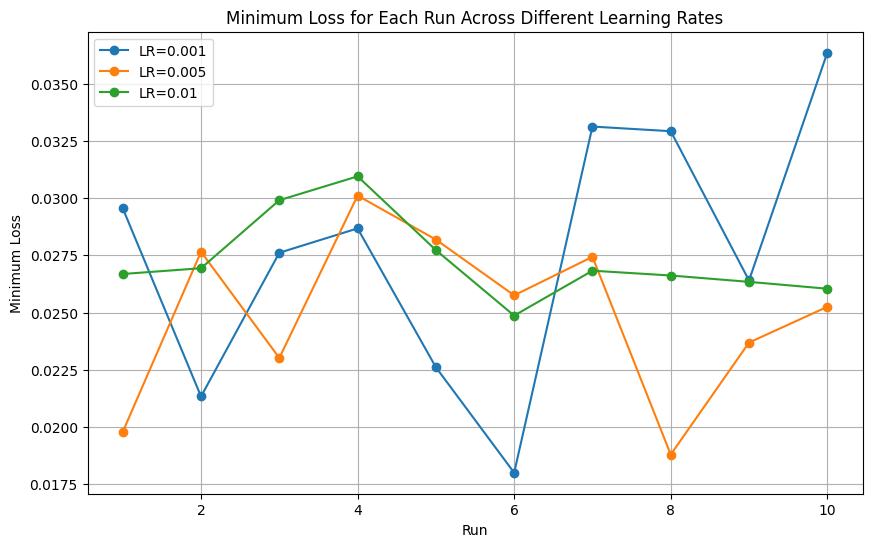

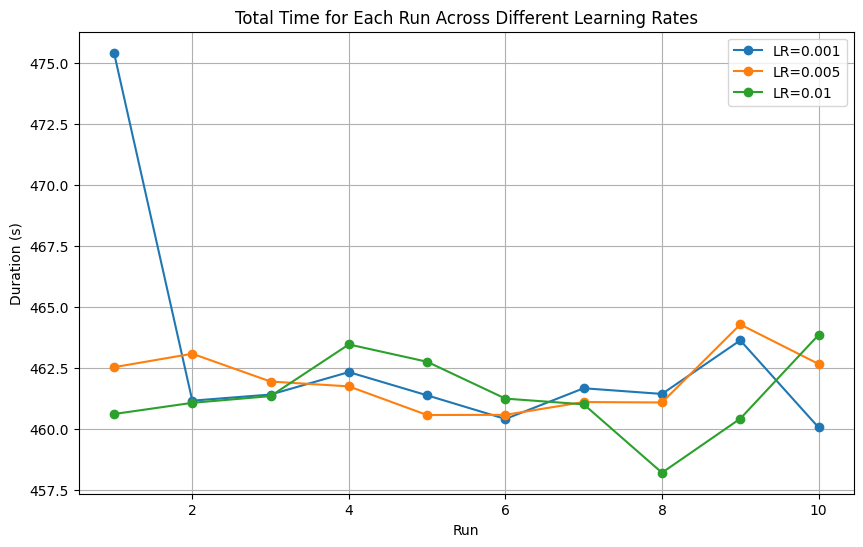

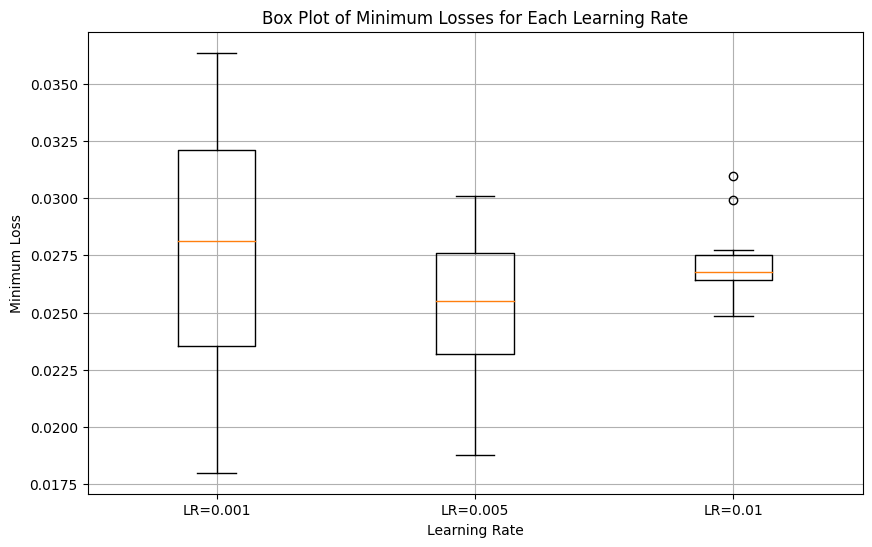

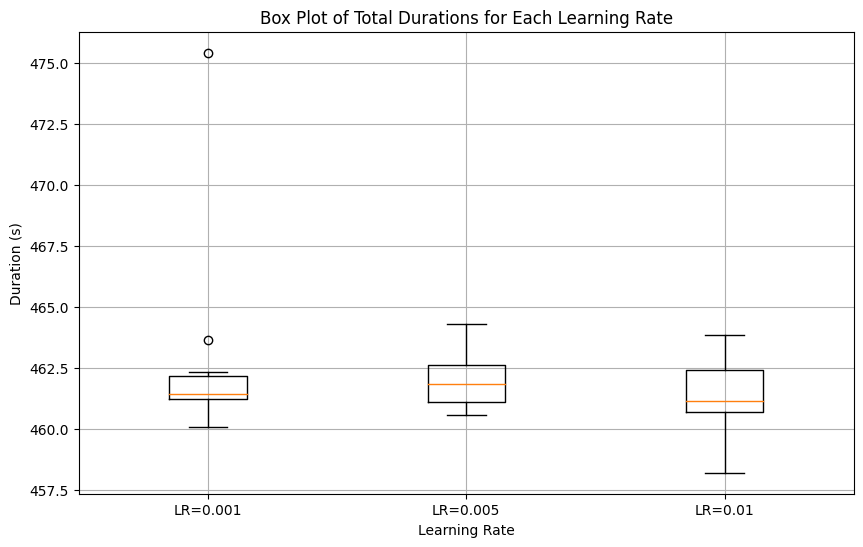

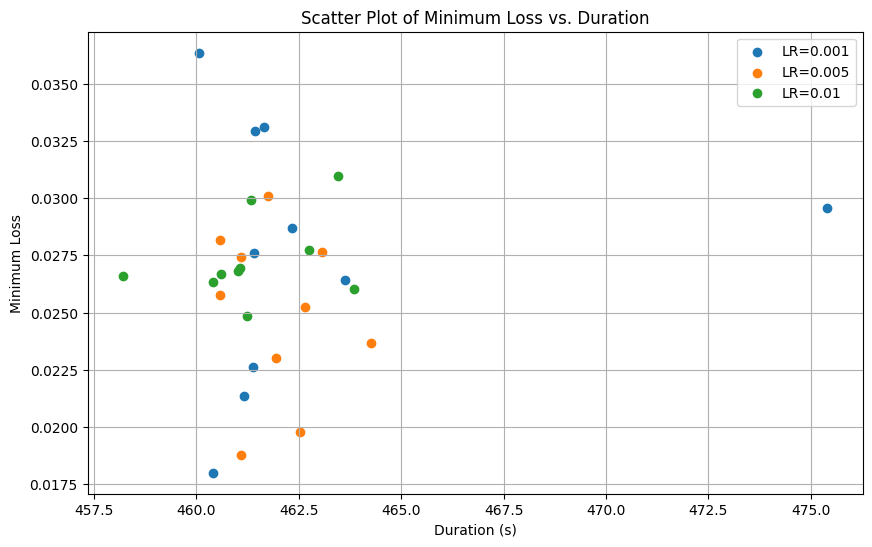

In [14]:
import matplotlib.pyplot as plt

# Assuming `results` is a list of lists with the structure [learning_rate, run, (min_loss, iteration), duration]

# Extract data for plotting
learning_rates = sorted(set(result[0] for result in results))
num_runs = len([result for result in results if result[0] == learning_rates[0]])

# Prepare data for plotting
loss_data = {lr: [] for lr in learning_rates}
time_data = {lr: [] for lr in learning_rates}

for result in results:
    lr, run, (min_loss, _), duration = result
    loss_data[lr].append(min_loss)
    time_data[lr].append(duration)

# Plot minimum loss for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), loss_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Minimum Loss')
plt.title('Minimum Loss for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Plot total time for each run
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.plot(range(1, num_runs + 1), time_data[lr], marker='o', label=f'LR={lr}')
plt.xlabel('Run')
plt.ylabel('Duration (s)')
plt.title('Total Time for Each Run Across Different Learning Rates')
plt.legend()
plt.grid(True)
plt.show()

# Box plot of minimum losses
plt.figure(figsize=(10, 6))
plt.boxplot([loss_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Minimum Loss')
plt.title('Box Plot of Minimum Losses for Each Learning Rate')
plt.grid(True)
plt.show()

# Box plot of total durations
plt.figure(figsize=(10, 6))
plt.boxplot([time_data[lr] for lr in learning_rates], labels=[f'LR={lr}' for lr in learning_rates])
plt.xlabel('Learning Rate')
plt.ylabel('Duration (s)')
plt.title('Box Plot of Total Durations for Each Learning Rate')
plt.grid(True)
plt.show()

# Scatter plot of minimum loss vs. duration
plt.figure(figsize=(10, 6))
for lr in learning_rates:
    plt.scatter(time_data[lr], loss_data[lr], label=f'LR={lr}')
plt.xlabel('Duration (s)')
plt.ylabel('Minimum Loss')
plt.title('Scatter Plot of Minimum Loss vs. Duration')
plt.legend()
plt.grid(True)
plt.show()
